Notebook relatif à la partie ***3.1.1.Répartition géographique des établissements sanitaires*** du rapport 

# Répartition géographique 

In [1]:
# Importation  des modules 
import numpy as np 
import pandas as pd 
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Importation de la base ID de la SAE
ID=pd.read_csv('../input/id-2019/ID_2019r.csv' ,sep=';', encoding='latin-1')

In [3]:
ID.head()

,bor,an,fi,rs,rscom,fi_ej,grp,stj,stjr,cat,...,TYPMD2,TYPMD3,FIFU1,FIFU2,FIFU3,SCFU1,SCFU2,SCFU3,VAL,RESPREG
0,ID,2019,010000024,CENTRE HOSPITALIER DE FLEYRIAT,NaN,010780054,4,13,1,355,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,P,184
1,ID,2019,010000032,CENTRE HOSPITALIER DE BELLEY,NaN,010780062,4,13,1,355,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,P,184
2,ID,2019,010000065,CH DE TREVOUX - MONTPENSIER,NaN,010780096,4,13,1,355,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,P,184
3,ID,2019,010000081,CENTRE HOSPITALIER DU PAYS DE GEX,NaN,010780112,4,13,1,106,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,P,184
4,ID,2019,010000099,CENTRE HOSPITALIER DE MEXIMIEUX,NaN,010780120,4,13,1,106,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,P,184


## Répartition des hopitaux en France 

### Répartition départementale 

In [4]:
Dep_Freq = pd.DataFrame({'Departement' : ID['dep'].value_counts().index.tolist() , 'Frequence': ID['dep'].value_counts()})

In [5]:
Dep_Freq.sort_values(by=['Departement'])

,Departement,Frequence
01,01,36
02,02,34
03,03,16
04,04,18
05,05,22
...,...,...
9A,9A,39
9B,9B,27
9C,9C,14
9D,9D,60


In [6]:
# Importation de la base geojson
departements_tot = gpd.read_file('../input/departements-avec-outre-mer/departements-avec-outre-mer.geojson')
departements_tot.head(-10)

,code,nom,geometry
0,971,Guadeloupe,"MULTIPOLYGON (((-61.79038 16.16682, -61.79164 ..."
1,972,Martinique,"MULTIPOLYGON (((-60.86733 14.38867, -60.86802 ..."
2,973,Guyane,"MULTIPOLYGON (((-53.87049 5.74494, -53.86464 5..."
3,976,Mayotte,"MULTIPOLYGON (((45.04101 -12.64686, 45.04139 -..."
4,01,Ain,"POLYGON ((4.78021 46.17668, 4.78024 46.18905, ..."
...,...,...,...
86,82,Tarn-et-Garonne,"POLYGON ((1.06408 44.37851, 1.06719 44.37953, ..."
87,83,Var,"MULTIPOLYGON (((6.39497 42.98688, 6.39391 42.9..."
88,84,Vaucluse,"MULTIPOLYGON (((4.89291 44.36482, 4.89318 44.3..."
89,85,Vendée,"MULTIPOLYGON (((-2.30479 46.70942, -2.30209 46..."


In [7]:
# Changement de codage des départements d'outre mer pour pouvoir fusion les tables
departements_tot['code']= departements_tot['code'].replace(['971', '972', '973','974','976'],['9A', '9B', '9C', '9D','9F'])

In [8]:
# Fusion
Tot=pd.merge(departements_tot, Dep_Freq, left_on = ['code'], right_on = ['Departement'])
Tot

,code,nom,geometry,Departement,Frequence
0,9A,Guadeloupe,"MULTIPOLYGON (((-61.79038 16.16682, -61.79164 ...",9A,39
1,9B,Martinique,"MULTIPOLYGON (((-60.86733 14.38867, -60.86802 ...",9B,27
2,9C,Guyane,"MULTIPOLYGON (((-53.87049 5.74494, -53.86464 5...",9C,14
3,9F,Mayotte,"MULTIPOLYGON (((45.04101 -12.64686, 45.04139 -...",9F,5
4,01,Ain,"POLYGON ((4.78021 46.17668, 4.78024 46.18905, ...",01,36
...,...,...,...,...,...
96,92,Hauts-de-Seine,"POLYGON ((2.29097 48.95097, 2.29162 48.95077, ...",92,77
97,93,Seine-Saint-Denis,"POLYGON ((2.55306 49.00982, 2.55814 49.01201, ...",93,57
98,94,Val-de-Marne,"POLYGON ((2.33190 48.81701, 2.33371 48.81677, ...",94,48
99,95,Val-d'Oise,"POLYGON ((2.59052 49.07965, 2.59013 49.07786, ...",95,43


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
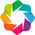

In [9]:
import geoviews as gv
from holoviews import dim, opts
import holoviews as hv

hv.extension('bokeh', 'matplotlib')

In [10]:
deps = gv.Polygons(Tot, vdims=['nom','Frequence'])
deps.opts(width=600, height=600, toolbar='above', color=dim('Frequence')+40, 
             colorbar=True, tools=['hover'], aspect='equal')

:Polygons   [Longitude,Latitude]   (nom,Frequence)

In [11]:
Tot.describe()

,Frequence
count,101.000000
mean,39.782178
std,26.468322
min,5.000000
25%,22.000000
50%,32.000000
75%,49.000000
max,155.000000


### Répartition régionale 

In [12]:
# Création des tables 
Reg_Freq = pd.DataFrame({'Region' : ID['reg'].value_counts().index.tolist() , 'Frequence': ID['reg'].value_counts()})
regions_tot = gpd.read_file('../input/regions-avec-outre-mer/regions-avec-outre-mer.geojson')

In [13]:
# Changement de format pour la correspondance des tables
regions_tot['code']=pd.to_numeric(regions_tot['code'])

In [14]:
# Fusion
Reg_tot=pd.merge(regions_tot, Reg_Freq, left_on = ['code'], right_on = ['Region'])

In [15]:
# Visualisation
regs = gv.Polygons(Reg_tot, vdims=['nom','Frequence'])
regs.opts(width=600, height=600, toolbar='above', color=dim('Frequence'), 
             colorbar=True, tools=['hover'], aspect='equal')

:Polygons   [Longitude,Latitude]   (nom,Frequence)

**Quelques statistiques descriptives**

In [16]:
# Metropole + outre-mer
Reg_tot.describe()

,code,Region,Frequence
count,18.000000,18.000000,18.000000
mean,39.388889,39.388889,223.222222
std,33.223200,33.223200,170.669118
min,1.000000,1.000000,5.000000
25%,7.250000,7.250000,44.250000
50%,30.000000,30.000000,198.500000
75%,69.500000,69.500000,364.000000
max,94.000000,94.000000,486.000000


In [17]:
# Metropole sans Corse 
values=[1,2,3,4,6,94]
filtered_df = Reg_tot[~Reg_tot.code.isin(values)]
filtered_df.describe()

,code,Region,Frequence
count,12.000000,12.000000,12.000000
mean,49.916667,49.916667,319.583333
std,26.780109,26.780109,120.213793
min,11.000000,11.000000,160.000000
25%,27.750000,27.750000,199.750000
50%,48.000000,48.000000,349.000000
75%,75.250000,75.250000,417.500000
max,93.000000,93.000000,486.000000


## Répartition pour 100 000 habitants 

### Répartition départementale 

In [18]:
pop = gpd.read_file('../input/pop-francaise-par-departement/population-francaise-par-departement-2018.csv')

/opt/conda/lib/python3.7/site-packages/geopandas/geodataframe.py:422: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


In [19]:
pop['Code Département']= pop['Code Département'].replace(['971', '972', '973','974','976'],['9A', '9B', '9C', '9D','9F'])

In [24]:
# Fusion
Dep_pop=pd.merge(Tot, pop[['Population','Code Département']], left_on = ['Departement'], right_on = ['Code Département'])

In [25]:
Dep_pop['Population']=pd.to_numeric(Dep_pop['Population'])

In [26]:
Dep_pop['Hop_pour_100000_hab']=Dep_pop['Frequence']/Dep_pop['Population']*100000
Dep_pop

,code,nom,geometry,Departement,Frequence,Population,Code Département,Hop_pour_100000_hab
0,9A,Guadeloupe,"MULTIPOLYGON (((-61.79038 16.16682, -61.79164 ...",9A,39,390704,9A,9.981981
1,9B,Martinique,"MULTIPOLYGON (((-60.86733 14.38867, -60.86802 ...",9B,27,371246,9B,7.272806
2,9C,Guyane,"MULTIPOLYGON (((-53.87049 5.74494, -53.86464 5...",9C,14,281612,9C,4.971379
3,9F,Mayotte,"MULTIPOLYGON (((45.04101 -12.64686, 45.04139 -...",9F,5,259154,9F,1.929355
4,01,Ain,"POLYGON ((4.78021 46.17668, 4.78024 46.18905, ...",01,36,649654,01,5.541411
...,...,...,...,...,...,...,...,...
96,92,Hauts-de-Seine,"POLYGON ((2.29097 48.95097, 2.29162 48.95077, ...",92,77,1612788,92,4.774341
97,93,Seine-Saint-Denis,"POLYGON ((2.55306 49.00982, 2.55814 49.01201, ...",93,57,1646105,93,3.462720
98,94,Val-de-Marne,"POLYGON ((2.33190 48.81701, 2.33371 48.81677, ...",94,48,1401228,94,3.425567
99,95,Val-d'Oise,"POLYGON ((2.59052 49.07965, 2.59013 49.07786, ...",95,43,1242746,95,3.460080


In [27]:
# Metropole sans Corse 
values=['9D','9A','9B','9C','9F','2A','2B']
filtered_df = Dep_pop[~Dep_pop.code.isin(values)]
filtered_df.describe()

,Frequence,Population,Hop_pour_100000_hab
count,94.000000,9.400000e+01,94.000000
mean,40.797872,6.880883e+05,6.884671
std,26.766847,5.197282e+05,2.687930
min,6.000000,7.546300e+04,3.303494
25%,22.000000,3.076480e+05,5.409368
50%,34.500000,5.470095e+05,6.505263
75%,49.000000,8.903362e+05,7.664341
max,155.000000,2.613874e+06,22.527596


In [28]:
deps_population = gv.Polygons(Dep_pop, vdims=['nom','Hop_pour_100000_hab'])
deps_population.opts(width=600, height=600, toolbar='above',color=dim('Hop_pour_100000_hab'), 
             colorbar=True, tools=['hover'], aspect='equal',cmap='reds')

:Polygons   [Longitude,Latitude]   (nom,Hop_pour_100000_hab)

### Répartition régionale

In [29]:
pop_region = gpd.read_file('../input/population-francaise-par-region/Regions.csv')

/opt/conda/lib/python3.7/site-packages/geopandas/geodataframe.py:422: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


In [30]:
Reg_tot

,code,nom,geometry,Region,Frequence
0,11,Île-de-France,"POLYGON ((2.59052 49.07965, 2.59602 49.08171, ...",11,486
1,24,Centre-Val de Loire,"POLYGON ((2.87463 47.52042, 2.87984 47.51671, ...",24,160
2,27,Bourgogne-Franche-Comté,"POLYGON ((3.62942 46.74946, 3.62655 46.75228, ...",27,193
3,28,Normandie,"MULTIPOLYGON (((-1.11962 49.35557, -1.11554 49...",28,196
4,32,Hauts-de-France,"POLYGON ((4.14090 49.97876, 4.14407 49.97625, ...",32,355
5,44,Grand Est,"POLYGON ((4.23316 49.95775, 4.23690 49.95858, ...",44,343
6,52,Pays de la Loire,"MULTIPOLYGON (((-2.62284 47.40975, -2.62341 47...",52,201
7,53,Bretagne,"MULTIPOLYGON (((-3.47716 48.88127, -3.47863 48...",53,214
8,75,Nouvelle-Aquitaine,"MULTIPOLYGON (((1.41519 46.34722, 1.41675 46.3...",75,407
9,76,Occitanie,"MULTIPOLYGON (((1.78613 42.57362, 1.78661 42.5...",76,449


In [31]:
pop_region['CODREG']=pd.to_numeric(pop_region['CODREG'])
pop_region['PTOT']=pd.to_numeric(pop_region['PTOT'])

In [32]:
Reg_pop=pd.merge(Reg_tot, pop_region[['PTOT','CODREG']], left_on = ['code'], right_on = ['CODREG'])
Reg_pop

,code,nom,geometry,Region,Frequence,PTOT,CODREG
0,11,Île-de-France,"POLYGON ((2.59052 49.07965, 2.59602 49.08171, ...",11,486,12291279.0,11.0
1,24,Centre-Val de Loire,"POLYGON ((2.87463 47.52042, 2.87984 47.51671, ...",24,160,2634852.0,24.0
2,27,Bourgogne-Franche-Comté,"POLYGON ((3.62942 46.74946, 3.62655 46.75228, ...",27,193,2885864.0,27.0
3,28,Normandie,"MULTIPOLYGON (((-1.11962 49.35557, -1.11554 49...",28,196,3403309.0,28.0
4,32,Hauts-de-France,"POLYGON ((4.14090 49.97876, 4.14407 49.97625, ...",32,355,6096177.0,32.0
5,44,Grand Est,"POLYGON ((4.23316 49.95775, 4.23690 49.95858, ...",44,343,5657093.0,44.0
6,52,Pays de la Loire,"MULTIPOLYGON (((-2.62284 47.40975, -2.62341 47...",52,201,3846161.0,52.0
7,53,Bretagne,"MULTIPOLYGON (((-3.47716 48.88127, -3.47863 48...",53,214,3407564.0,53.0
8,75,Nouvelle-Aquitaine,"MULTIPOLYGON (((1.41519 46.34722, 1.41675 46.3...",75,407,6094367.0,75.0
9,76,Occitanie,"MULTIPOLYGON (((1.78613 42.57362, 1.78661 42.5...",76,449,5968795.0,76.0


In [33]:
Reg_pop['Hop_pour_100000_hab']=Reg_pop['Frequence']/Reg_pop['PTOT']*100000

In [34]:
reg_population = gv.Polygons(Reg_pop, vdims=['nom','Hop_pour_100000_hab'])
reg_population.opts(width=600, height=600, toolbar='above',color=dim('Hop_pour_100000_hab'),cmap='reds', 
             colorbar=True, tools=['hover'], aspect='equal')

:Polygons   [Longitude,Latitude]   (nom,Hop_pour_100000_hab)

In [35]:
# Metropole sans Corse 
values=[1,2,3,4,6,94]
filtered_df = Reg_pop[~Reg_pop.code.isin(values)]
filtered_df.describe()

,code,Region,Frequence,PTOT,CODREG,Hop_pour_100000_hab
count,12.000000,12.000000,12.000000,1.200000e+01,12.000000,12.000000
mean,49.916667,49.916667,319.583333,5.459401e+06,49.916667,6.080602
std,26.780109,26.780109,120.213793,2.707394e+06,26.780109,0.935424
min,11.000000,11.000000,160.000000,2.634852e+06,11.000000,3.954023
25%,27.750000,27.750000,199.750000,3.406500e+06,27.750000,5.747780
50%,48.000000,48.000000,349.000000,5.381886e+06,48.000000,6.067816
75%,75.250000,75.250000,417.500000,6.094820e+06,75.250000,6.680667
max,93.000000,93.000000,486.000000,1.229128e+07,93.000000,7.522456


In [36]:
Reg_pop['Hop_pour_100000_hab'].describe()

count    18.000000
mean      6.394112
std       2.008192
min       1.849304
25%       5.725137
50%       6.176297
75%       7.099238
max      11.168817
Name: Hop_pour_100000_hab, dtype: float64